In [1]:
import sys
print(sys.path)

['E:\\学习\\5药物研发\\靶点发现\\下游任务\\单细胞\\跨物种\\came\\CAME_3\\analysis\\jupyterlab\\3micro_annotation', 'C:\\Users\\10360\\anaconda3\\envs\\py39\\python39.zip', 'C:\\Users\\10360\\anaconda3\\envs\\py39\\DLLs', 'C:\\Users\\10360\\anaconda3\\envs\\py39\\lib', 'C:\\Users\\10360\\anaconda3\\envs\\py39', '', 'C:\\Users\\10360\\AppData\\Roaming\\Python\\Python39\\site-packages', 'C:\\Users\\10360\\anaconda3\\envs\\py39\\lib\\site-packages', 'C:\\Users\\10360\\anaconda3\\envs\\py39\\lib\\site-packages\\win32', 'C:\\Users\\10360\\anaconda3\\envs\\py39\\lib\\site-packages\\win32\\lib', 'C:\\Users\\10360\\anaconda3\\envs\\py39\\lib\\site-packages\\Pythonwin']


In [2]:
import os
import time
import torch
import shutil
import warnings
import argparse
import importlib
import scanpy as sc

import pandas as pd
import numpy as np

from CAMEX.base import Dataset
from CAMEX.trainer import Trainer

warnings.filterwarnings("ignore")

In [3]:
from params import PARAMS

In [4]:
sc.settings.set_figure_params(facecolor='white', frameon=False, dpi=300, dpi_save=300, figsize=(4, 4))

In [5]:
def clear_fig(fig):
    if fig:
        fig.axes[0].set_xlabel(None)
        fig.axes[0].set_ylabel(None)
        fig.tight_layout()
    else:
        pass
    return fig

In [6]:
# path = './'

In [7]:
time_start = time.strftime("%Y-%m-%d-%H-%M-%S")
log_path = f'./log/{time_start}/'
for k, v in PARAMS.items():
    v['time_start'] = time_start
    v['log_path'] = log_path
print(log_path)

./log/2024-03-23-13-58-44/


In [8]:
os.makedirs(log_path, exist_ok=True)
shutil.copy('params.py', log_path + 'params_current.py')
print(f'time: {time_start}')

time: 2024-03-23-13-58-44


In [9]:
#  —————————————————————————————————— 1 preprocess
print('start preprocess')
dataset = Dataset(**PARAMS['preprocess'])
# torch.save(dataset, log_path + 'dataset_preprocessed.pt')
# dataset = torch.load(f'{args.path}/log/2023-06-06-09-02-45/dataset_preprocessed.pt')
adata_CAMEX = dataset.adata_whole
dgl_data = dataset.dgl_data

start preprocess
                      raw-brain-Human-ma: reference  raw-brain-Chimpanzee-ma: query  raw-brain-Marmoset-ma: query  raw-brain-Rhesus-ma: query
Micro P2RY12 APBB1IP                           6811                          5679.0                        4626.0                      8058.0
Micro P2RY12 GLDN                               435                            69.0                           NaN                         NaN
Micro P2RY12 CCL3                               310                             NaN                           NaN                         NaN



In [10]:
print('start train')
trainer = Trainer(adata_CAMEX, dgl_data, **PARAMS['train'])

start train


In [11]:
trainer.pretrain()

--------------------------------------------- pretrain ---------------------------------------------
epoch: 0, loss: 126.90071822375786
epoch: 1, loss: 28.097599076061712
epoch: 2, loss: 27.689407906881193
epoch: 3, loss: 27.458248417551925
epoch: 4, loss: 27.25648284539944
epoch: 5, loss: 27.133080645305355
epoch: 6, loss: 27.06400852668576
epoch: 7, loss: 26.981405118616618
epoch: 8, loss: 26.97822203287264
epoch: 9, loss: 26.91684848506276


In [12]:
trainer.train()

--------------------------------------------- train ---------------------------------------------
epoch: 0, loss: 25.229591101408005
train_acc: {'raw-brain-Human-macell_acc': 0.9224}, test_acc: {'raw-brain-Chimpanzee-macell_acc': 0.988, 'raw-brain-Marmoset-macell_acc': 1.0, 'raw-brain-Rhesus-macell_acc': 1.0}, train_ami:{'raw-brain-Chimpanzee-macell_ami': 0.0, 'raw-brain-Human-macell_ami': 0.0328, 'raw-brain-Marmoset-macell_ami': 0.0, 'raw-brain-Rhesus-macell_ami': 0.0}, best_epoch: 0
epoch: 1, loss: 19.549192428588867
train_acc: {'raw-brain-Human-macell_acc': 0.957}, test_acc: {'raw-brain-Chimpanzee-macell_acc': 0.9894, 'raw-brain-Marmoset-macell_acc': 1.0, 'raw-brain-Rhesus-macell_acc': 0.9999}, train_ami:{'raw-brain-Chimpanzee-macell_ami': 0.0009, 'raw-brain-Human-macell_ami': 0.0918, 'raw-brain-Marmoset-macell_ami': 0.0, 'raw-brain-Rhesus-macell_ami': 0.0001}, best_epoch: 1
epoch: 2, loss: 17.412957906723022
train_acc: {'raw-brain-Human-macell_acc': 0.969}, test_acc: {'raw-brain-Ch

In [13]:
adata_CAMEX.write_h5ad(log_path + 'adata_CAMEX.h5ad', compression='gzip')

# analysis

# plot UMAP

In [7]:
log_path = './log/2024-03-23-13-58-44/'

In [8]:
log_path

'./log/2024-03-23-13-58-44/'

In [9]:
adata_CAMEX = sc.read_h5ad(log_path + 'adata_CAMEX.h5ad')
adata_CAMEX

AnnData object with n_obs × n_vars = 25988 × 2000
    obs: 'cell_name', 'subtype', 'subclass', 'class', 'samplename', 'tech_rep', 'species', 'cell_ontology_class', 'batch', 'n_genes_by_counts', 'total_counts', 'cell_ontology_class_num', 'cell_class', 'cell_class_num'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'cell_type', 'data_order', 'dataset_description', 'dataset_type', 'hvg', 'log1p', 'neighbors', 'pca'
    obsm: 'X_pca', 'cell_pretrain_hidden', 'cell_train_class', 'cell_train_hidden', 'cell_train_hidden_eval'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [14]:
sc.pp.neighbors(adata_CAMEX, use_rep='cell_train_hidden')

In [15]:
sc.tl.umap(adata_CAMEX, min_dist=0.1)

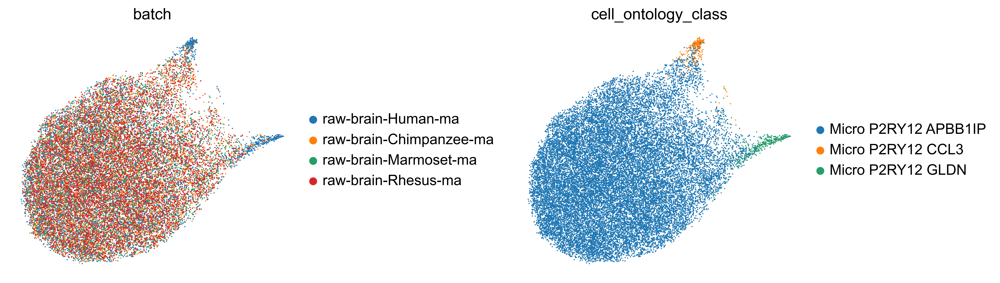

In [16]:
sc.pl.umap(adata_CAMEX, color=['batch', 'cell_ontology_class'], wspace=0.6)

In [17]:
sc.tl.umap(adata_CAMEX)

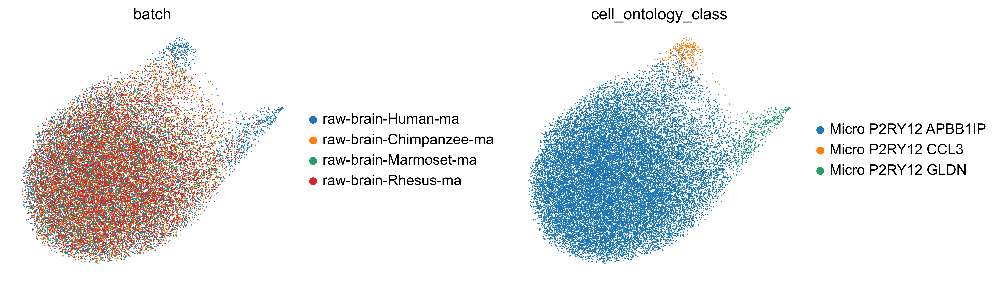

In [18]:
sc.pl.umap(adata_CAMEX, color=['batch', 'cell_ontology_class'], wspace=0.6)